# Анализ рынка заведений общественного питания Москвы.

### Описание проекта
Цель - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на лето 2022 года.

<a id='top'></a>
### План работы
1. [Обзор данных.](#section1)
2. [Предобработка данных.](#section2)
3. [Исследование данных.](#section3)
4. [Детализация исследования.](#section4)
5. [Презентация.](#section5)

<a id='section1'></a>
### Обзор данных.

In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
import matplotlib.pyplot as plt

In [2]:
places = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


В данных нет уникального идентификатора заведения. Поэтому, объединив столбцы `name` и `address` создадим новый столбец, который будет однозначно идентифицировать каждую строку нашего датасета.

In [4]:
places['id'] = places['name'] + ', ' + places['address']

In [5]:
places['id'].nunique()

8406

In [6]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  id                 8406 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 985.2+ KB


В данных представлены 8406 заведений. В ряде столбцов есть пропуски. Типы данных соответствуют содержанию. Приступим к обработке.

<a id='section2'></a>
### Предобработка данных.
[Оглавление](#top)

Проверим данные на дубликаты.

In [7]:
duplicated_places = places[places.duplicated()]
duplicated_places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               0 non-null      object 
 1   category           0 non-null      object 
 2   address            0 non-null      object 
 3   district           0 non-null      object 
 4   hours              0 non-null      object 
 5   lat                0 non-null      float64
 6   lng                0 non-null      float64
 7   rating             0 non-null      float64
 8   price              0 non-null      object 
 9   avg_bill           0 non-null      object 
 10  middle_avg_bill    0 non-null      float64
 11  middle_coffee_cup  0 non-null      float64
 12  chain              0 non-null      int64  
 13  seats              0 non-null      float64
 14  id                 0 non-null      object 
dtypes: float64(6), int64(1), object(8)
memory usage: 0.0+ bytes


Дубликатов не обнаружено. В столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill `, `middle_coffee_cup` и `seats ` много пропусков. Корректно заполнить мы их не можем. Так как их довольно много, удалить их также будет некорректно, поэтому оставим пропуски.

Создадим столбец `street` с названиями улиц из столбца с адресом, он пригодится нам в дальнейшей работе.

In [8]:
streets = ['проспект', "площадь", "улица", "шоссе", 
                   "бульвар", 'переулок','набережная','проезд','Зеленоград',
                   'тупик','микрорайон','территория','километр','посёлок','деревня'
                   ,'аллея','просек','линия','квартал','село','вблизи', 'парк', 'заказник', 'округ', 'заповедник', 'ул.', 'тоннель', 'пр-т', 'мост', 'сад', 'сквер', 'памятник', 'кольцо']
def get_street(row):
    address = row['address'].split(', ')
    parts = len(address)    
    try:
        for item in streets:
            for i in range(parts):
                if item in address[i]:  
                    return address[i]
    except:
        return 'Error'
    
places['street'] = places.apply(get_street, axis=1)

Также создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглоуточно.

In [9]:
places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно')

Мы проверили, что в данных нет дубликатов, оставили пропуски, так как не можем их корректно обработать. Также мы добавили столбцы `street` и `is_24/7`, которые пригодятся нам в дальнейшей работе. Можно приступать к анализу.

<a id='section3'></a>
### Анализ данных.
[Оглавление](#top)

Напишем функции для построения графиков.

In [10]:
def bar_show(df, x_axis, y_axis, my_title, xaxis_title, yaxis_title, text_column):
    px.bar(df, x=x_axis, y=y_axis, text=text_column).update_layout(title=my_title, xaxis_title=xaxis_title, yaxis_title=yaxis_title).show()

In [11]:
def barplot_show(x_axis, y_axis, df, hue_column, title, x_label, y_label):
    sns.set_style('dark')
    plt.figure(figsize=(10, 4))
    sns.barplot(x=x_axis, y=y_axis, data=df, hue=hue_column)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.xticks(rotation=45)
    plt.legend(loc='lower right', fontsize=10)
    plt.grid()
    plt.show()    

In [12]:
def bar_2_show(df, x_axis, y_axis, color_column, my_title):
    fig = px.bar(df, x=x_axis, y=y_axis, color=color_column, title=my_title)
    fig.update_xaxes(tickangle=45)
    fig.update_layout(width=1000, height=800)
    fig.show()

In [13]:
def choropleth_moscow(df, columns, color, legend):
    m = Map(location=[55.751244, 37.618423], zoom_start=10)
    Choropleth(
        geo_data='/datasets/admin_level_geomap.geojson',
        data=df,
        columns=columns,
        key_on='feature.name',
        fill_color=color,
        fill_opacity=0.8,
        legend_name=legend,
    ).add_to(m)
    return m

Посмотрим какие категории заведений представлены в данных.

In [14]:
category = places.groupby('category').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False)
category.columns = ['category', 'count']
bar_show(category, 'category', 'count', 'Категории заведений', 'Категории', 'Количество','count')

Больше всего заведений представлено в категориях кафе, ресторан и кофейня.

Посмотрим на количество посадочных мест в заведениях по категориям.

In [15]:
seats = places.groupby('category').agg({'seats': 'median'}).reset_index().sort_values(by='seats', ascending=False)
bar_show(seats, 'category', 'seats', 'Количество посадочных мест по категориям', 'Категории', 'Количество мест', 'seats')

По количеству посадочных мест лидируют рестораны, бары и пабы, а также кофейни.

Посмотрим на соотношение сетевых и несетевых заведений.

In [16]:
chain = places.groupby('chain').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False)
chain.columns = ['chain', 'count']
chain['chain'] = chain['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
bar_show(chain, 'chain', 'count', 'Количество сетевых и несетевых заведений', 'Принадлежность к сети', 'Количество заведений', 'count')

Несетевых заведений в данных заметно больше.

Посмотрим, какие категории заведений чаще являются сетевыми.

In [17]:
category_chain = places.groupby(['category', 'chain'], as_index = False)[['id']].nunique()
category_chain.columns = ['category', 'chain', 'count']
category_chain['chain'] = category_chain['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
category_chain

,category,chain,count
0,"бар,паб",несетевое,596
1,"бар,паб",сетевое,169
2,булочная,несетевое,99
3,булочная,сетевое,157
4,быстрое питание,несетевое,371
5,быстрое питание,сетевое,232
6,кафе,несетевое,1599
7,кафе,сетевое,779
8,кофейня,несетевое,693
9,кофейня,сетевое,720


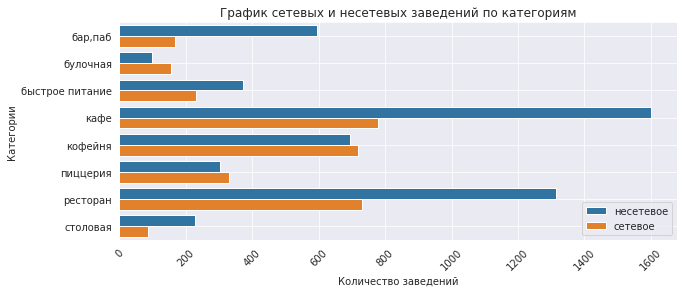

In [18]:
barplot_show('count', 'category', category_chain, 'chain', 'График сетевых и несетевых заведений по категориям', 'Количество заведений', 'Категории')

Чаще являются сетевыми категории кафе, ресторан и кофейня.

Найдем 15 самых популярных заведений.

In [19]:
top_places = places.groupby('name').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False).head(15)
top_places.columns = ['name', 'count']
top_places

,name,count
2890,Кафе,189
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
5083,Хинкальная,44
5421,Шаурма,43


In [20]:
top_15_places = top_places['name'].tolist()
places_15 = places.query('name in (@top_15_places)')
places_15 = places_15.groupby(['name', 'category'], as_index = False)[['id']].nunique().sort_values(by='id', ascending=False)
places_15.columns = ['Название', 'Категория', 'Количество']
bar_2_show(places_15, 'Название', 'Количество', 'Категория', 'Топ-15 мест')

Похоже, что самые популярные заведения в основном относятся к категориям кафе, кофейня, пиццерия и ресторан.

Посмотрим какие административные районы Москвы присутствуют в датасете, а также на количество заведений каждой категории по этим районам.

In [21]:
district_name = places.groupby('district').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False)
district_name.columns = ['district', 'total_cnt']
district_category = places.groupby(['district', 'category'], as_index = False)[['address']].nunique().sort_values(by='address', ascending=False)
district_category.columns = ['Район', 'Категория', 'Количество']
bar_2_show(district_category, 'Район', 'Количество', 'Категория', 'Количество заведений в каждой категории по районам')

В Центральном округе преобладают рестораны. В остальным округах незначительно лидируют кафе. Кофейни немного отстают, но их количество значительно.

Посмотрим как распределяется средний рейтинг по категориям заведений.

In [22]:
category_rating = places.groupby('category').agg({'rating': 'median'}).reset_index().sort_values(by='rating', ascending=False)
category_rating.columns = ['Категория', 'Рейтинг']
category_rating

,Категория,Рейтинг
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


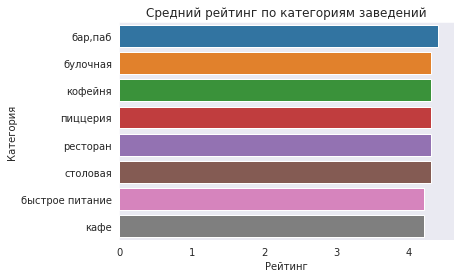

In [23]:
ax = sns.barplot(x='Рейтинг', y='Категория', data=category_rating).set(title='Средний рейтинг по категориям заведений')

Средние рейтинги заведений в разных категориях примерно одинаковые.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [24]:
district_rating = places.groupby('district').agg({'rating': 'median'}).reset_index().sort_values(by='rating', ascending=False)
district_rating

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [25]:
choropleth_moscow(district_rating, ['district', 'rating'], 'YlGn', 'Медианный рейтинг заведений по районам')

Заведения с самым высоким рейтингом находятся в центре. С самым низким рейтингом на северо-востоке и юго-востоке.

Отобразим все заведения на карте.

In [26]:
moscow_lat, moscow_lng = 55.751244, 37.618423
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(n)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


places.apply(create_clusters, axis=1)

n

Найдем топ-15 улиц по количеству заведений.

In [27]:
top_streets = places.groupby('street').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False).head(15)
top_streets.columns = ['street', 'count']
top_streets

,street,count
1120,проспект Мира,184
801,Профсоюзная улица,122
1117,проспект Вернадского,108
553,Ленинский проспект,107
551,Ленинградский проспект,95
400,Дмитровское шоссе,88
483,Каширское шоссе,77
322,Варшавское шоссе,76
552,Ленинградское шоссе,70
575,Люблинская улица,60


Помотрим как распределяется количество заведений по категориям на этих улицах.

In [28]:
top_15 = top_streets['street'].tolist()
places_top = places.query('street in (@top_15)')
places_top = places_top.groupby(['street', 'category'], as_index = False)[['name']].nunique().sort_values(by='name', ascending=False)
bar_2_show(places_top, 'street', 'name', 'category', 'Топ-15')

В топ-15 улиц по количеству заведений преобладают категории кафе и ресторан. Кофейни немного отстают, но их количество значительно.

Найдем улицы, на которых находится только один объект общепита.

In [29]:
one_streets = places.groupby('street').agg({'id': 'nunique'}).reset_index().query('id == 1') 
print(f"Всего улиц с одним заведением: {one_streets.shape[0]}")

Всего улиц с одним заведением: 479


Улиц, на которых находится только один объект общепита достатоточно много. Посмотрим какие это заведения.

In [30]:
place_1 = one_streets['street'].tolist()
places_one = places.query('street in (@place_1)')
p_1 = places_one.groupby('category').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False)
p_1

,category,id
3,кафе,170
6,ресторан,94
4,кофейня,88
0,"бар,паб",41
7,столовая,37
2,быстрое питание,24
5,пиццерия,15
1,булочная,10


In [31]:
bar_show(p_1, 'category', 'id', 'Категории на улицах с одним заведением', 'Категории', 'Количество', 'id')

На улицах с одним заведением преобладаю категории кафе, ресторан и кофейня.

Построим фоновую картограмму (хороплет) с медианными значениями среднего чека для каждого района.

In [32]:
district_bill= places.groupby('district').agg({'middle_avg_bill': 'median'}).reset_index().sort_values(by='middle_avg_bill', ascending=False)
district_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [33]:
choropleth_moscow(district_bill, ['district', 'middle_avg_bill'], 'YlOrRd', 'Медианный средний чек по районам')

Самые высокие цены в Центральном и Западном округах. По мере удаления от этих округов средний чек становится меньше.

Можем подвести следующие итоги:
- Больше всего в данных представлено заведений в категориях кафе, ресторан и кофейня.
- По количеству посадочных мест лидируют рестораны, бары/пабы и кофейни.
- В данных преобладают несетевые заведения.
- Сетевыми чаще являются заведения в категориях кафе, ресторан и кофейня.
- 15 самых популярных заведений относятся к типу быстрого питания.
- В Центральном округе преобладают рестораны. В остальных округах незначительно лидируют кафе. Кофейни немного отстают, но их количество значительно.
- Средние рейтинги заведений в разных категориях примерно одинаковые (4.2-4.4). Заведения с самым высоким рейтингом находятся в центре. С самым низким рейтингом на северо-востоке и юго-востоке.
- В топ-15 улиц по количеству заведений преобладают категории кафе и ресторан. Кофейни немного отстают, но их количество значительно.
- Улиц, на которых находится только один объект общепита достатоточно много (583). На них преобладают категории кафе, ресторан и кофейня.
- Самые высокие цены в Центральном и Западном округах. По мере удаления от этих округов средний чек становится меньше.

<a id='section4'></a>
### Детализация исследования.
[Оглавление](#top)

Заказчика интересует категория заведений кофейни. Сделаем срез и далее будем работать именн с это категорией.

In [34]:
perk = places.query('category == "кофейня"')

In [35]:
perk_cnt = perk.shape[0]
print(f"Всего кофеен: {perk_cnt}")

Всего кофеен: 1413


Всего в данных 1413 кофеен. Посмотрим, как они расположены по районам.

In [36]:
perk_district = perk.groupby('district').agg({'id': 'nunique'}).reset_index().sort_values(by='id', ascending=False)
perk_district.columns = ['district', 'count']
perk_district['percent'] = round(perk_district['count'] / perk_cnt, 3) * 100
perk_district

,district,count,percent
5,Центральный административный округ,428,30.3
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
1,Западный административный округ,150,10.6
8,Южный административный округ,131,9.3
0,Восточный административный округ,105,7.4
7,Юго-Западный административный округ,96,6.8
6,Юго-Восточный административный округ,89,6.3
4,Северо-Западный административный округ,62,4.4


In [37]:
choropleth_moscow(perk_district, ['district', 'count'], 'PuRd', 'Расположение кофеен по районам')

Больше всего кофеен в центре. На юге, востоке и северо-западе заведений этой категории меньше всего.

Посмотрим, есть ли круглосуточные кофейни.

In [38]:
print(perk.loc[perk['is_24/7'] == 'True', 'name'])

Series([], Name: name, dtype: object)


Круглосуточных кофеен не обнаружено.

Посмотрим на рейтинги кофеен по районам.

In [39]:
perk_rating = perk.groupby('district').agg({'rating': 'median'}).reset_index().sort_values(by='rating', ascending=False)
perk_rating

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


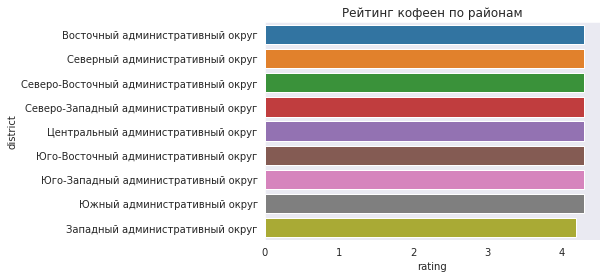

In [40]:
ax = sns.barplot(x='rating', y='district', data=perk_rating).set(title='Рейтинг кофеен по районам')

Рейтинги кофеен по районам почти не отличаются. Только в Западном округе он незначительно ниже.

Посмотрим на среднюю цену чашки капучино по районам.

In [41]:
coffee_cup = perk.groupby('district').agg({'middle_coffee_cup': 'median'}).reset_index().sort_values(by='middle_coffee_cup', ascending=False)
bar_show(coffee_cup, 'middle_coffee_cup', 'district', 'Стоимость чашки кофе по районам', 'Цена в рублях', 'Районы', 'middle_coffee_cup')

Самый дорогой капучино в Юго-Западном, Центральном и Западном районах (189 - 198). Самый дешевый капучино в Восточном округе (135).

В центре самое большое количество кофеен (30%), поэтому конкуренция довольно высока. Чтобы как-то выделиться на их фоне, можно рассмотреть вопрос об открытии круглосуточной кофейни, так как подобных заведений в представленных данных нет. 

Также можно рассмотреть районы, в которых кофеен меньше. Например, Юго-Западный округ, в котором заведений нужно типа только 6,8% от общего числа. В этом районе самая высокая средняя цена на капучино (198). Можно немного снизить цену, возможно это привлечет посетителей, так как конкуренция в этом районе небольшая.

<a id='section5'></a>
### Презентация
[Оглавление](#top)

Презентация: https://disk.yandex.ru/i/QKc3ZT-my4920g